# Compare Models in DND Image dataset (26th Jan 2020)

## Uses models from Working.ipynb trained on the S7 dataset

### U-NET Model with custom_loss() function

* Comparison on PSNR between Unet output with DND as input
* DND has no GT, only noisy input images
* Compare Residuals

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime
from skimage.restoration import estimate_sigma
import tensorflow as tf
import tensorflow.keras.backend as K
import tensorflow_probability as tfp
import os

/home/anthonyk/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/anthonyk/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/anthonyk/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/anthonyk/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.

In [2]:
print("TensorFlow version: {}".format(tf.__version__))
print("Eager execution: {}".format(tf.executing_eagerly()))
#print("GPU Available: {}".format(tf.test.is_gpu_available()))
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

TensorFlow version: 2.0.0-beta1
Eager execution: True
Num GPUs Available:  8


In [3]:
# Start to build input pipeline from S7 filepath dataset
list_ds = tf.data.Dataset.list_files('./DND/images_srgb_png/*.png')
val_list_ds = list_ds.take(40)        # List of Validation Images
rest_list_ds = list_ds.skip(40)         # remainder
test_list_ds = rest_list_ds.skip(10)    # List of Test Images

In [4]:
# How many files?
image_count = len([i for i in list_ds])
image_count_val = len([i for i in val_list_ds])
print(f'Total val Images :{image_count}')
print(f'Validation :{image_count_val}')


Total val Images :51
Validation :40


In [5]:
# Select a specific file for examination
val_im_ds = tf.data.Dataset.list_files('./DND/images_srgb_png/0037.png')

val_im_list = val_im_ds.take(1)

TF data API: how to efficiently sample small patches from images
https://stackoverflow.com/questions/48777889/tf-data-api-how-to-efficiently-sample-small-patches-from-images

You can achieve all that using the tf.data API by doing the following steps:

1. shuffle the filenames of the big images
2. read the big images
3. generate multiple patches from this image
4. shuffle again all these patches with a big enough buffer size (see this answer on buffer size). Adjusting the buffer size is a tradeoff between good shuffling and size of the cached patches
5. batch them
6. prefetch one batch


In [6]:
num_patches = 128                               # number of patches to extract from each image
patch_sz = 128                                  # patch size
patch_buf_sz = image_count_val * num_patches     # shuffle patches from 'image_count_tr' different images
batch_sz = 32
noise_std = 1e-6                                # AWG STD in Input Data Pipeline
AUTOTUNE = tf.data.experimental.AUTOTUNE
tf.random.set_seed(42)
lim=0.1

### Data Pipeline

In [7]:
def parse_fn(filename):
    ''' Takes "short" image filepath dataset.
    Returns processed "short" and "medium" image pairs'''
    
    image1 = read_decode(filename)   # Read 'short' image
    filename = tf.strings.regex_replace(filename, 'short','medium')
    image2 = read_decode(filename)   # Read 'medium' image

    return image1, image2

def read_decode(filename):
    '''Read Image Files and convert to image Tensors (0,1)'''
    image = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    return image

def get_rnd_patches(image1, image2, num_patches=100, patch_sz=64):
    '''Get Random Patches from image1 and corresponding patches from image2.
    Both images have the same dimensions'''
    patches1 = []
    patches2 = []
    for i in range(num_patches):
        image_height = 3024# image1.shape[0]
        image_width = 4032 # image1.shape[1]
        image_height = 2500# image1.shape[0]
        image_width = 2500 # image1.shape[1]

        top_left_x = tf.random.uniform([1], maxval=image_width-patch_sz, dtype=tf.int32)
        top_left_y = tf.random.uniform([1], maxval=image_height-patch_sz, dtype=tf.int32)
        patch1 = tf.image.crop_to_bounding_box(image1, top_left_y[0], top_left_x[0], patch_sz, patch_sz)
        patch2 = tf.image.crop_to_bounding_box(image2, top_left_y[0], top_left_x[0], patch_sz, patch_sz)
        
        noise = tf.random.normal(shape=tf.shape(patch1), mean=0.0, stddev=noise_std, dtype=tf.float32)
        
        #patch1 = patch1 - tf.reduce_mean(patch1, axis=[-2, -3], keepdims=True)    # zero mean
        patch2 = patch2 - tf.reduce_mean(patch2, axis=[-2, -3], keepdims=True)    # zero mean
        patch1 = patch2 + noise     # Add noise to the 'Ground Truth (medium)' dataset to train on
    
        patches1.append(patch1)
        patches2.append(patch2)

    patches1 = tf.stack(patches1)    # patches from image1
    patches2 = tf.stack(patches2)    # patches from image2

    return patches1, patches2   # Noisy , Clean

def get_patches(image1, image2, top_left_x, top_left_y, num_patches=100, patch_sz=64):
    '''Get Random Patches from image1 and corresponding patches from image2.
    Both images have the same dimensions'''
    patches1 = []
    patches2 = []
    for i in range(num_patches):
        image_height = 3024# image1.shape[0]
        image_width = 4032 # image1.shape[1]
        image_height = 2500# image1.shape[0]
        image_width = 2500 # image1.shape[1]
        
        top_left_x = (top_left_x + patch_sz) % (image_width - patch_sz)

        patch1 = tf.image.crop_to_bounding_box(image1, top_left_y, top_left_x, patch_sz, patch_sz)
        patch2 = tf.image.crop_to_bounding_box(image2, top_left_y, top_left_x, patch_sz, patch_sz)
        
        noise = tf.random.normal(shape=tf.shape(patch1), mean=0.0, stddev=noise_std, dtype=tf.float32)
        
        #patch1 = patch1 - tf.reduce_mean(patch1, axis=[-2, -3], keepdims=True)    # zero mean
        patch2 = patch2 - tf.reduce_mean(patch2, axis=[-2, -3], keepdims=True)    # zero mean
        patch1 = patch2 + noise     # Add noise to the 'Ground Truth (medium)' dataset to train on
    
        patches1.append(patch1)
        patches2.append(patch2)

    patches1 = tf.stack(patches1)    # patches from image1
    patches2 = tf.stack(patches2)    # patches from image2

    return patches1, patches2   # Noisy , Clean

# Lambda function to call inline
get_rnd_patches_fn = lambda image1, image2: get_rnd_patches(image1, image2,
                                                        num_patches=num_patches, patch_sz=patch_sz)

get_patches_fn = lambda image1, image2: get_patches(image1, image2, top_left_x=xpos, top_left_y=ypos,
                                                    num_patches=num_patches, patch_sz=patch_sz)

def data_pipeline(list_ds, image_buf_sz, patch_buf_sz, batch_sz, patch_sz):
    '''Read and Process image files into batches of random patches from random files.
    dataset : Tensor file list
    Read image_buf_sz images from file,
    shuffle, convert to image Tensors, get random patches,
    shuffle patches, batch in to batch_sz'''
        
    list_ds = list_ds.shuffle(buffer_size=image_buf_sz)                  # Shuffle file list Tensor
    dataset = list_ds.map(parse_fn, num_parallel_calls=AUTOTUNE)         # Read and process files
    dataset = dataset.map(get_rnd_patches_fn, num_parallel_calls=AUTOTUNE)   # Get Patches
    dataset = dataset.unbatch()   
    dataset = dataset.shuffle(buffer_size=patch_buf_sz)                  # Shuffle Patches
    dataset = dataset.batch(batch_sz).prefetch(1)                        # Re-batch & Pre-fetch
    
    return dataset

def image_pipeline(list_ds, batch_sz, patch_sz):
    '''Read and Process one selected image files into batches of selected patches.'''
    dataset = list_ds.map(parse_fn, num_parallel_calls=AUTOTUNE)         # Read and process files
    dataset = dataset.map(get_patches_fn, num_parallel_calls=AUTOTUNE)   # Get Patches
    dataset = dataset.unbatch()  
    dataset = dataset.batch(batch_sz).prefetch(1)                        # Re-batch & Pre-fetch
    
    return dataset

In [8]:
# Random Image, Patch Pipeline
val_ds = data_pipeline(val_list_ds, image_buf_sz=image_count_val,
                                    patch_buf_sz=patch_buf_sz, batch_sz=batch_sz, patch_sz=patch_sz)

xpos = 800
ypos = 1450
# Selected Image / Patch Pipeline
val_im_ds = image_pipeline(val_im_list, batch_sz=batch_sz, patch_sz=patch_sz)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

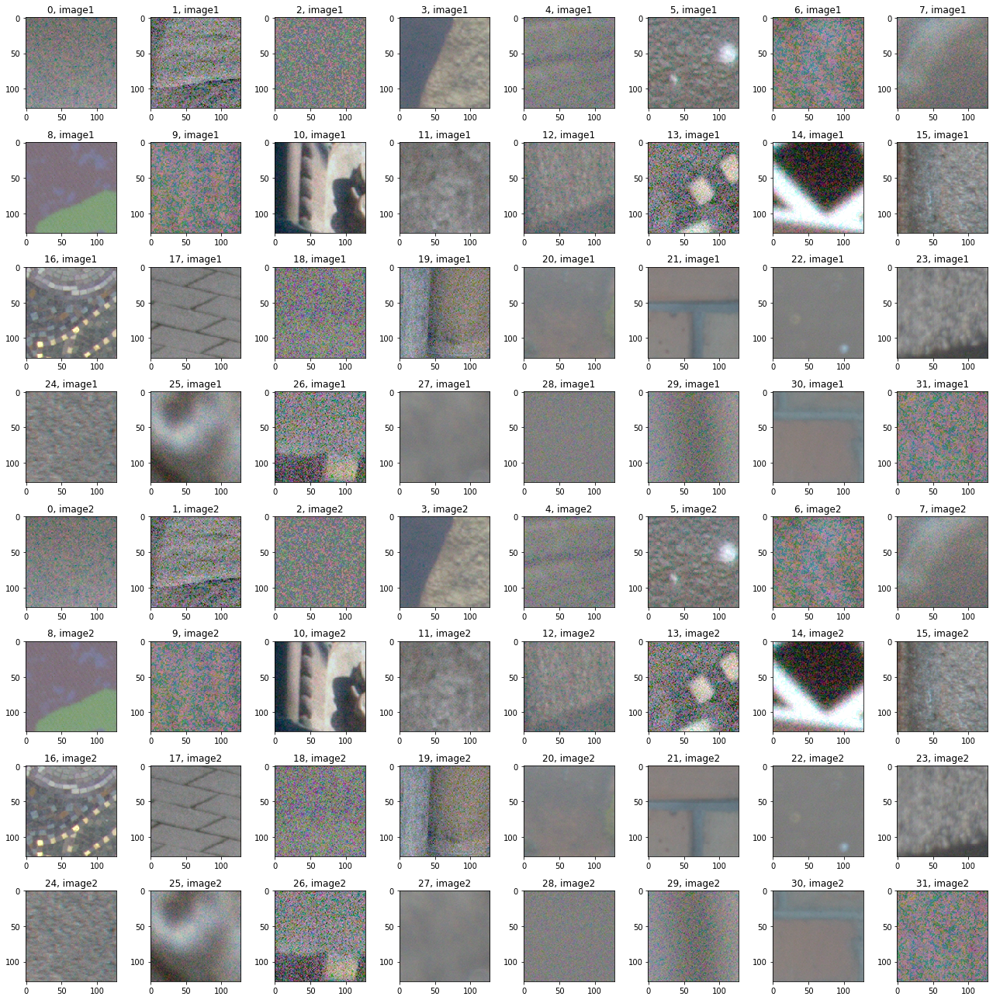

In [9]:
# Show 1 batch of random val patches for visualisation purposes
plt.figure(figsize=(18,18))
for i in val_ds.take(1):
    for j in range(32):
        plt.subplot(8,8,j+1)
        plt.title(f'{j}, image1')
        plt.imshow(0.5 + i[0][j])
        plt.subplot(8,8,32+j+1)
        plt.title(f'{j}, image2')
        plt.imshow(0.5 + i[1][j])
plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


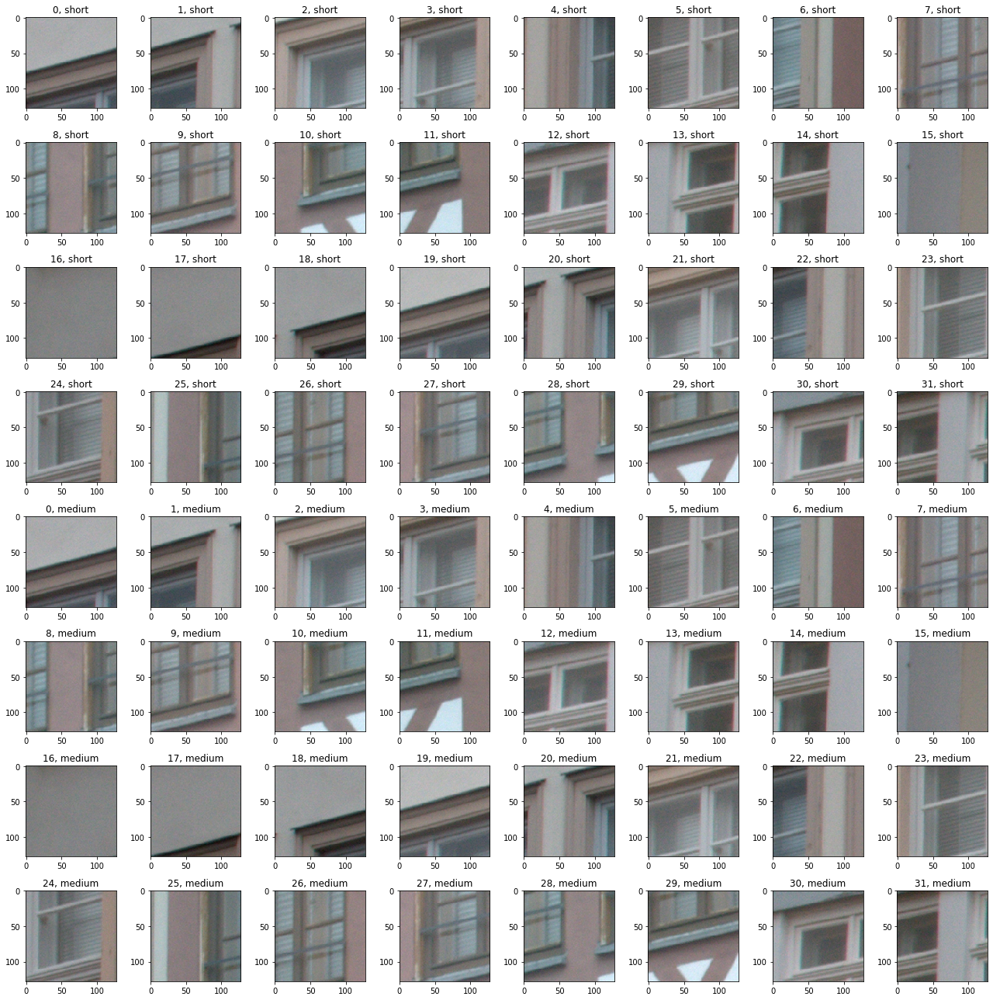

In [10]:
# Show 1 batch of chosen image patches for visualisation purposes
plt.figure(figsize=(18,18))
for i in val_im_ds.take(1):
    for j in range(32):
        plt.subplot(8,8,j+1)
        plt.title(f'{j}, short')
        plt.imshow(0.5 + i[0][j])
        plt.subplot(8,8,32+j+1)
        plt.title(f'{j}, medium')
        plt.imshow(0.5 + i[1][j])
plt.tight_layout()

## U-Net
Ronneberger, O., Fischer, P. and Brox, T. (2015) ‘U-Net: Convolutional Networks for Biomedical Image Segmentation’, in Lecture Notes in Computer Science (including subseries Lecture Notes in Artificial Intelligence and Lecture Notes in Bioinformatics), pp. 234–241. doi: 10.1007/978-3-319-24574-4_28.
http://link.springer.com/10.1007/978-3-319-24574-4_28

## Custom Loss Function
* Use MSE between Input and Ground-truth for main Loss. GT can be Input (zero loss), Noisy input, Medium exposure Image etc...

ref:
Géron, A., 2019. Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow: Concepts, Tools, and Techniques to Build Intelligent Systems. O'Reilly Media.

In [11]:
def custom_loss(y_true, y_pred):
    
    loss = tf.reduce_mean(tf.square(y_true-y_pred))
    
    return loss

# Load the model if required
* unet **005 : Noisy (1E-3)**/ Clean pairs. MSE loss (in custom_loss fn). 200 epochs. 20200114-172040/train (on Titan) for 200,
* 20200113-212401/validation for 1k
* unet **006 : Noisy (1E-2)**/ Clean pairs. MSE loss (in custom_loss fn). 200 epochs. 20200114-201701/validation
* unet **007: Noisy (1E-1)**/ Clean pairs. MSE loss (in custom_loss fn). 200 epochs. 20200114-230106/train
* unet **008: Clean** / Clean pairs. MSE loss (in custom_loss fn). 200 epochs. 20200115-192414/train
* unet 009: MSE + Residual Loss

In [12]:
model_version = 'Titan0007'
model_name = 'unet'
model_path = os.path.join('models',model_name, model_version+'model.h5')

tf.keras.backend.clear_session()  # Reset Model

model = tf.keras.models.load_model(model_path, custom_objects={"custom_loss":custom_loss})

# Predict

In [13]:
val_ex = next(iter(val_im_ds.take(1)))
#val_ex = next(iter(val_ds.take(1)))

In [14]:
pred_ar = model.predict(val_ex, steps=1)

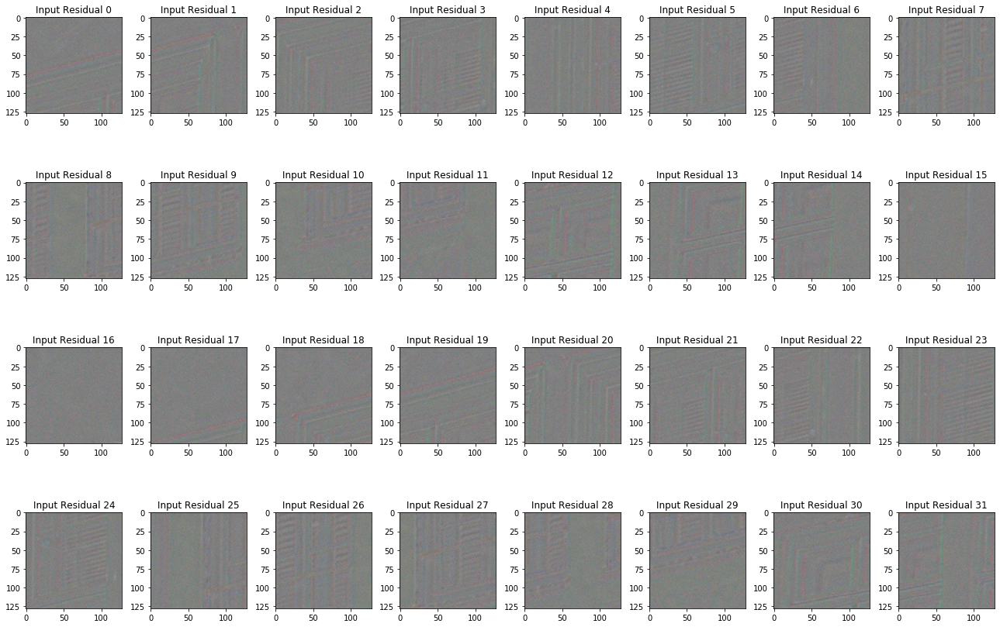

In [15]:
plt.figure(figsize=(18,12))

for j in range(32):
    plt.subplot(4,8,j+1)
    plt.title(f'Input Residual {j}')
    plt.imshow(0.5+pred_ar[j]-val_ex[0][j])
plt.tight_layout()

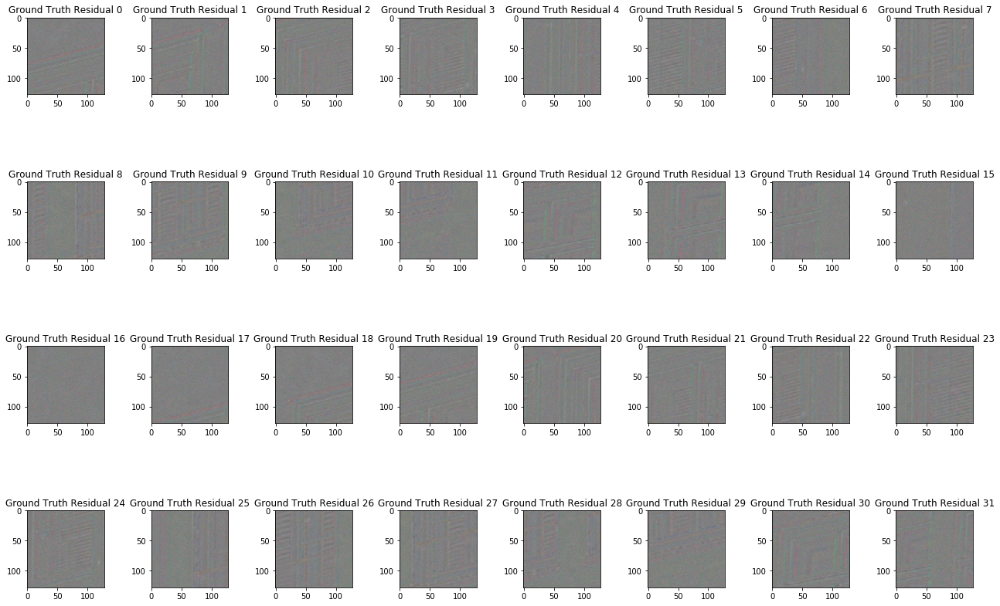

In [16]:
plt.figure(figsize=(18,12))

for j in range(32):
    plt.subplot(4,8,j+1)
    plt.title(f'Ground Truth Residual {j}')
    plt.imshow(0.5+pred_ar[j]-val_ex[1][j])
plt.tight_layout()

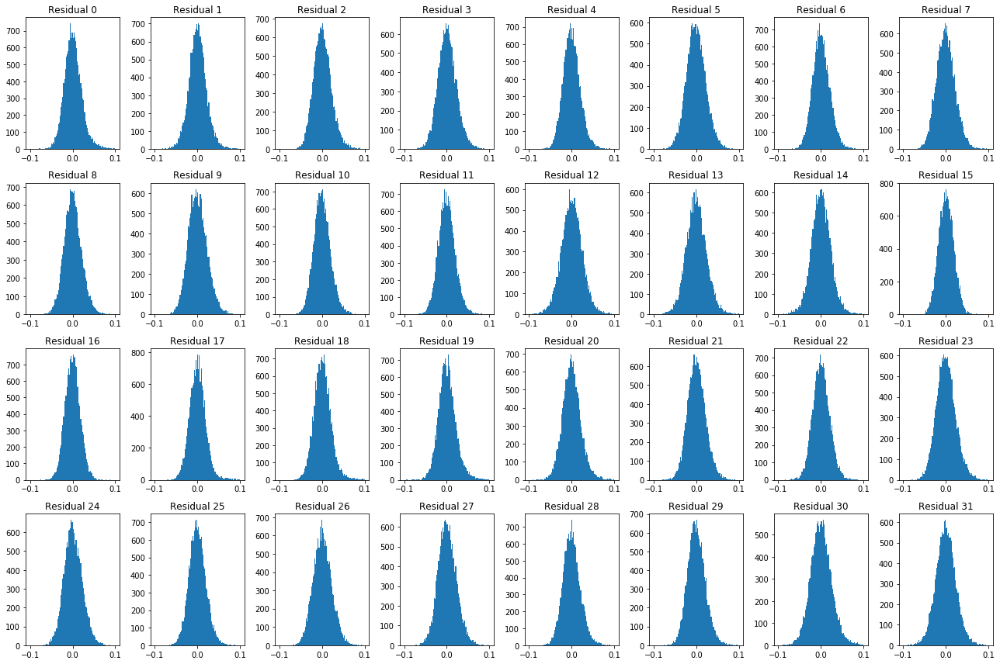

In [17]:
plt.figure(figsize=(18,12))

for j in range(32):
    plt.subplot(4,8,j+1)
    plt.title(f'Residual {j}')
    plt.hist(pred_ar[j].reshape(-1,3)[:,0]-val_ex[1][j].numpy().reshape(-1,3)[:,0], range=(-lim,lim),bins=100)
plt.tight_layout()


/home/anthonyk/.local/lib/python3.6/site-packages/skimage/restoration/_denoise.py:755: UserWarning: image is size 3 on the last axis, but multichannel is False.  If this is a color image, please set multichannel to True for proper noise estimation.
  warn(msg.format(image.shape[-1]))


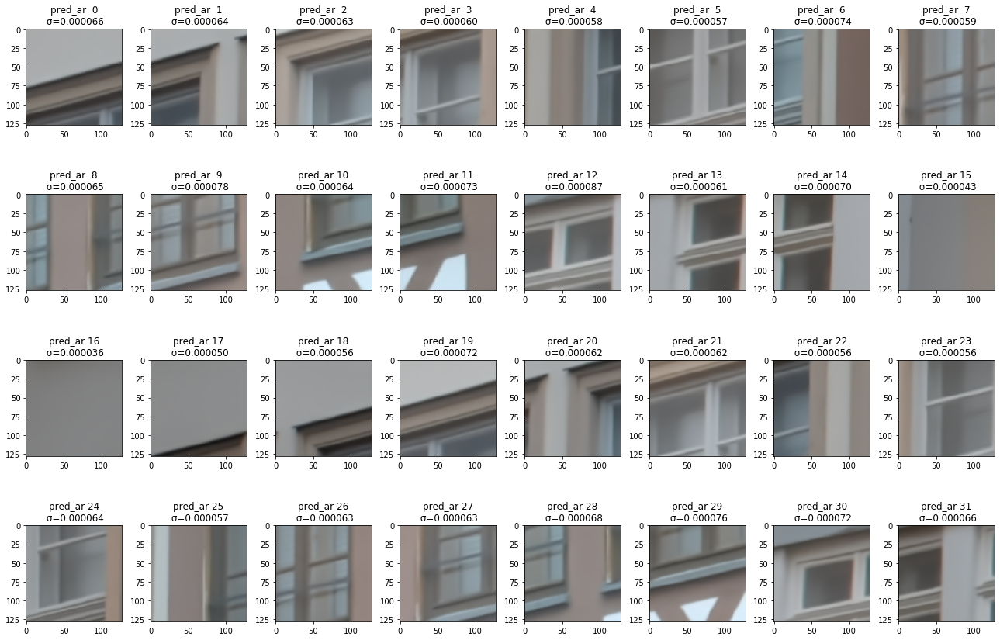

In [18]:
plt.figure(figsize=(18,12))

for j in range(32):
    plt.subplot(4,8,j+1)
    plt.title("pred_ar {:2d}\n σ={:4f}".format(j,estimate_sigma(pred_ar[j])))
    plt.imshow(0.5 + pred_ar[j])

plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


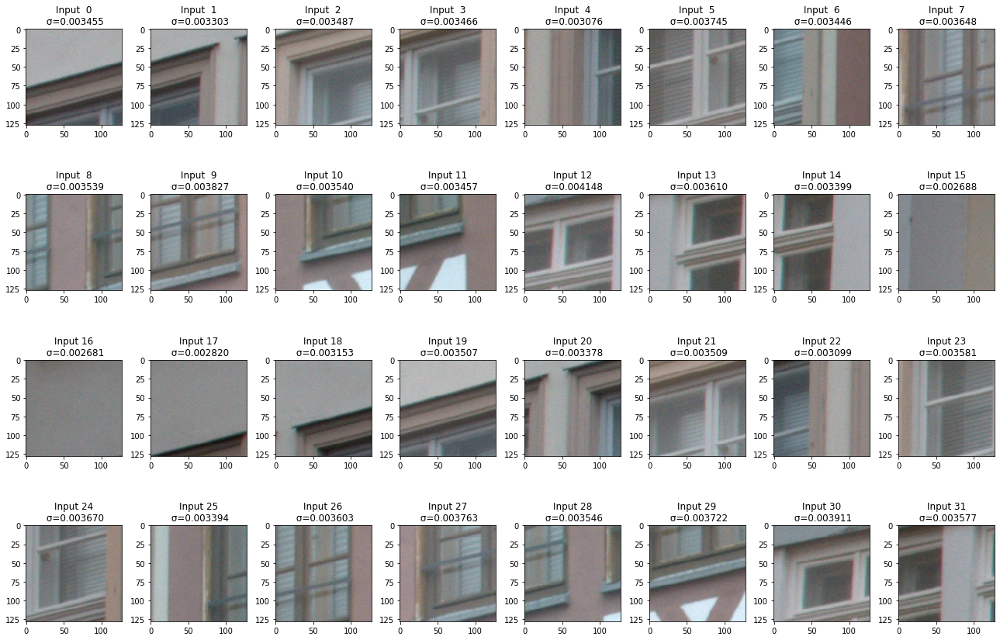

In [19]:
plt.figure(figsize=(18,12))

for j in range(32):
    plt.subplot(4,8,j+1)
    plt.title("Input {:2d}\n σ={:4f}".format(j,estimate_sigma(val_ex[0][j])))
    plt.imshow(0.5 + val_ex[0][j])

plt.tight_layout()

In [20]:
# PSNR vs [ip, gt, residual]
np.c_[tf.image.psnr(val_ex[0],pred_ar, max_val=2).numpy(),
      tf.image.psnr(val_ex[1],pred_ar, max_val=2).numpy(),
     10*np.log10(2/tf.math.reduce_variance((val_ex[0]-pred_ar),axis=[-1,-2,-3]))]

array([[41.308937, 41.308937, 38.303993],
       [41.24373 , 41.243732, 38.236507],
       [41.112106, 41.112106, 38.104652],
       [40.753273, 40.75327 , 37.74466 ],
       [41.4343  , 41.4343  , 38.425995],
       [40.586857, 40.58686 , 37.579185],
       [41.39761 , 41.397606, 38.389202],
       [40.241024, 40.241024, 37.23332 ],
       [40.760845, 40.760845, 37.75329 ],
       [40.525448, 40.52545 , 37.518818],
       [41.22284 , 41.22284 , 38.216217],
       [41.42235 , 41.422356, 38.413025],
       [39.910427, 39.910427, 36.903286],
       [40.209045, 40.20905 , 37.202427],
       [40.574165, 40.57417 , 37.56762 ],
       [42.515163, 42.515163, 39.50522 ],
       [42.83115 , 42.83115 , 39.82518 ],
       [42.250782, 42.250786, 39.25254 ],
       [41.634956, 41.634956, 38.63318 ],
       [41.28866 , 41.28866 , 38.280834],
       [40.760464, 40.760464, 37.753456],
       [41.200363, 41.200363, 38.19387 ],
       [41.33686 , 41.336864, 38.328045],
       [40.516033, 40.516033, 37.5

In [21]:
-10*np.log10(tf.math.reduce_mean(tf.math.square(val_ex[0]-pred_ar),axis=[-1,-2,-3]))

array([35.28834 , 35.223133, 35.09151 , 34.732674, 35.413704, 34.56626 ,
       35.37701 , 34.220425, 34.74025 , 34.50485 , 35.202244, 35.401756,
       33.889828, 34.188446, 34.55357 , 36.494564, 36.81055 , 36.230186,
       35.614357, 35.268063, 34.73987 , 35.179764, 35.31626 , 34.495434,
       34.867825, 35.08383 , 34.368454, 34.48094 , 34.899845, 34.99838 ,
       34.08571 , 34.326893], dtype=float32)

In [22]:
def PSNR(rgb1, rgb2):
    return 20*np.log10(255/(np.mean(pow(rgb1-rgb2,2))))

## Train with Custom Loss over image pairs

Note use of Generator to present batches
https://keras.io/getting-started/faq/#how-can-i-use-keras-with-datasets-that-dont-fit-in-memory


Also: https://stackoverflow.com/questions/39263002/calling-fit-multiple-times-in-keras
states that you can call .fit multiple times to continue training

Also:
https://stackoverflow.com/questions/58022713/tensorflow-2-0-custom-loss-function-with-multiple-inputs

and
https://www.tensorflow.org/tutorials/customization/custom_training_walkthrough

## Analyse the Residual

## Examine Output

In [23]:
def PSNR(rgb1, rgb2):
    rgb1 = rgb1-rgb1.mean()
    rgb2 = rgb2-rgb2.mean()
    return np.mean(pow(rgb1-rgb2,2))
    return 20*np.log10(255/(np.mean(pow(rgb1-rgb2,2))))

* Reference: J. Immerkær, “Fast Noise Variance Estimation”, Computer Vision and Image Understanding, Vol. 64, No. 2, pp. 300-302, Sep. 1996 [PDF]
* https://stackoverflow.com/questions/2440504/noise-estimation-noise-measurement-in-image

In [24]:
from scipy.signal import convolve2d

def estimate_noise(I):
    '''I: grey scale image
    Out: Variance of image noise'''
    
    I = I.squeeze()  # remove last 1 dim if present
    
    H, W = I.shape

    M = np.array([[1, -2, 1],
       [-2, 4, -2],
       [1, -2, 1]])

    sigma = np.sum(np.sum(np.absolute(convolve2d(I, M))))
    sigma = sigma * np.sqrt(0.5 * np.pi) / (6 * (W-2) * (H-2))

    return sigma

### Examine the Residual
* Note **the Prediction is LESS NOISY thatn the groud-truth**
* This means noise reduction is inherent in the Network and not learned e.g. (Lempitsky, V., Vedaldi, A., & Ulyanov, D. (2018). Deep Image Prior. Proceedings of the IEEE Computer Society Conference on Computer Vision and Pattern Recognition, 9446–9454. https://doi.org/10.1109/CVPR.2018.00984)


Text(0.5, 1.0, 'Residual. σ=3.64e-03')

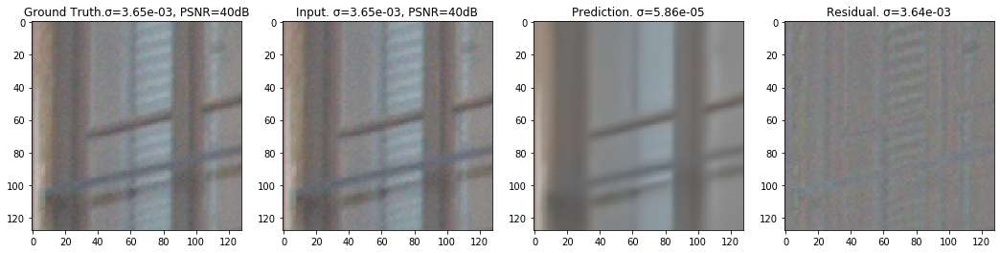

In [25]:
ind=7
plt.figure(figsize=(18,12))
plt.subplot(1,4,1)
plt.imshow(0.5+val_ex[1][ind])
plt.title('Ground Truth.σ={:4.2e}, PSNR={:2.0f}dB'.format(estimate_sigma(val_ex[1][ind]),
          tf.image.psnr(pred_ar[ind],val_ex[1][ind], max_val=2)))
plt.subplot(1,4,2)
plt.imshow(0.5+val_ex[0][ind])
plt.title('Input. σ={:4.2e}, PSNR={:2.0f}dB'.format(estimate_sigma(val_ex[0][ind]),
          tf.image.psnr(pred_ar[ind],val_ex[0][ind], max_val=2)))
plt.subplot(1,4,3)
plt.imshow(0.5+pred_ar[ind])
plt.title('Prediction. σ={:4.2e}'.format(estimate_sigma(pred_ar[ind])))
plt.subplot(1,4,4)
plt.imshow(0.5+val_ex[0][ind]-pred_ar[ind])
plt.title('Residual. σ={:4.2e}'.format(estimate_sigma(val_ex[0][ind]-pred_ar[ind])))
#plt.show()

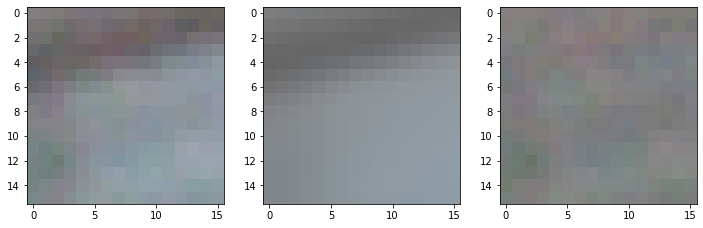

In [26]:
# Tiny Patch 1

# patch1 = tf.image.crop_to_bounding_box(image1, top_left_y, top_left_x, patch_sz, patch_sz)

in_patch = tf.image.crop_to_bounding_box(val_ex[0][ind], 60, 60, 16, 16)
out_patch = tf.image.crop_to_bounding_box(pred_ar[ind], 60, 60, 16, 16)
res_patch = in_patch - out_patch
res_patch[:,:,0].numpy().shape
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.imshow(in_patch+0.5)
plt.subplot(1,3,2)
plt.imshow(out_patch+0.5)
plt.subplot(1,3,3)
plt.imshow(res_patch+0.5)
plt.show()

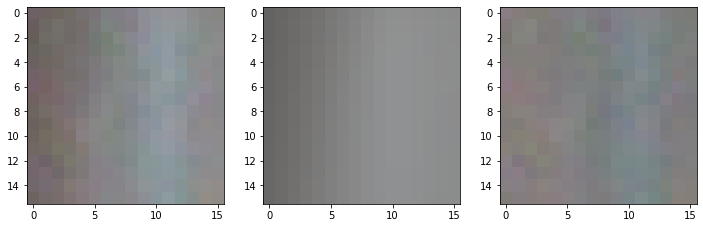

In [27]:
# Tiny Patch 2

# patch1 = tf.image.crop_to_bounding_box(image1, top_left_y, top_left_x, patch_sz, patch_sz)

in_patch = tf.image.crop_to_bounding_box(val_ex[0][ind], 100, 100, 16, 16)
out_patch = tf.image.crop_to_bounding_box(pred_ar[ind], 100, 100, 16, 16)
res_patch2 = in_patch - out_patch
res_patch2[:,:,0].numpy().shape
plt.figure(figsize=(12,4))
plt.subplot(1,3,1)
plt.imshow(in_patch+0.5)
plt.subplot(1,3,2)
plt.imshow(out_patch+0.5)
plt.subplot(1,3,3)
plt.imshow(res_patch2+0.5)
plt.show()

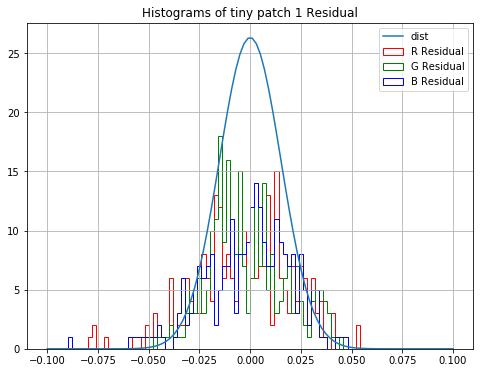

Mean:  [-0.00350402 -0.00115252 -0.00110435]
Std:  [0.02371707 0.01937421 0.0213452 ]


In [28]:
plt.figure(figsize=(8,6))

plt.hist(res_patch.numpy().reshape(-1,3)[:,0],
         histtype='step', range=(-lim,lim), bins=100, label='R Residual', color='r')

plt.hist(res_patch.numpy().reshape(-1,3)[:,1],
         histtype='step', range=(-lim,lim), bins=100, label='G Residual', color='g')

plt.hist(res_patch.numpy().reshape(-1,3)[:,2],
         histtype='step', range=(-lim,lim), bins=100, label='B Residual', color='b')


from scipy.stats import norm
x = np.linspace(-lim,lim, num=100)
a = val_ex[0][ind].numpy().reshape(-1,3)[:,0] - pred_ar[ind].reshape(-1,3)[:,0]
d = norm.pdf(x, 0, a.std()*0.7)
d = d*1
plt.plot(x,d,label = 'dist')

plt.legend()
plt.grid()
plt.title('Histograms of tiny patch 1 Residual')
plt.show()

print('Mean: ',res_patch.numpy().reshape(-1,3).mean(axis=-2))
print('Std: ',res_patch.numpy().reshape(-1,3).std(axis=-2))

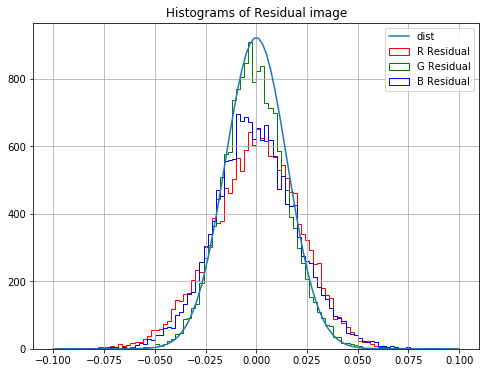

Mean:  [-0.00019265 -0.00098577 -0.00024756]
Std:  [0.02164818 0.01582578 0.02037267]


In [29]:
plt.figure(figsize=(8,6))

plt.hist(val_ex[0][ind].numpy().reshape(-1,3)[:,0] - pred_ar[ind].reshape(-1,3)[:,0],
         histtype='step', range=(-lim,lim), bins=100, label='R Residual', color='r')

plt.hist(val_ex[0][ind].numpy().reshape(-1,3)[:,1] - pred_ar[ind].reshape(-1,3)[:,1],
         histtype='step', range=(-lim,lim), bins=100, label='G Residual', color='g')

plt.hist(val_ex[0][ind].numpy().reshape(-1,3)[:,2] - pred_ar[ind].reshape(-1,3)[:,2],
         histtype='step', range=(-lim,lim), bins=100, label='B Residual', color='b')

from scipy.stats import norm
x = np.linspace(-lim,lim, num=100)
a = val_ex[0][ind].numpy().reshape(-1,3)[:,0] - pred_ar[ind].reshape(-1,3)[:,0]
d = norm.pdf(x, 0, a.std()*0.7)
d = d*50*0.7
plt.plot(x,d,label = 'dist')

plt.legend()
plt.grid()
plt.title('Histograms of Residual image')
plt.show()

res = val_ex[0][ind] - pred_ar[ind]

print('Mean: ',res.numpy().reshape(-1,3).mean(axis=-2))
print('Std: ',res.numpy().reshape(-1,3).std(axis=-2))

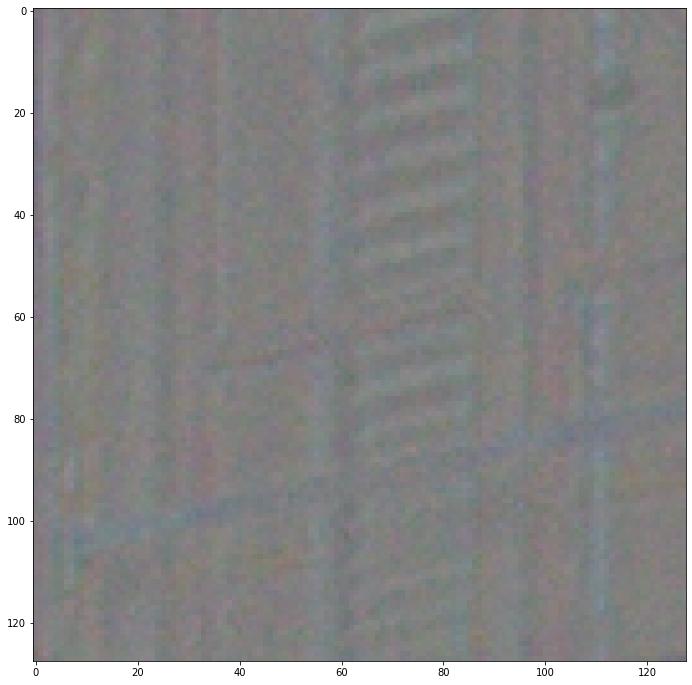

In [106]:
plt.figure(figsize=(12,12))
res = val_ex[1][ind]-pred_ar[ind]
plt.imshow(0.5+res)
plt.show()

KL divR:  0.51581043
KL divG:  0.3363513
KL divB:  0.49962395


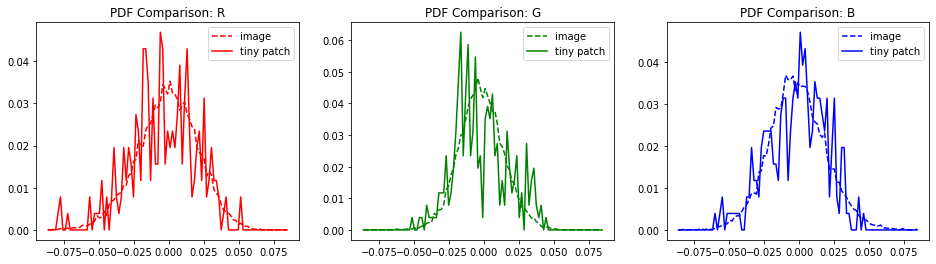

KL 0.7929796315137406


In [107]:
# PDFs of image versus tiny patch1

#edges = tf.linspace(-0.1,0.1,100)

li = 4*tf.math.reduce_std(res_patch)
edges = tf.linspace(-li,li,100)

plt.figure(figsize=(16,4))

# R
res_histo = tfp.stats.histogram(res[:,:,0], edges)
res_pdf = res_histo/tf.reduce_sum(res_histo)      # pdf sums to 1

res_patch_histo = tfp.stats.histogram(res_patch[:,:,0], edges)
res_patch_pdf = res_patch_histo/tf.reduce_sum(res_patch_histo)      # pdf sums to 1

KLdivR = tf.keras.losses.kullback_leibler_divergence(res_pdf, res_patch_pdf).numpy()

print('KL divR: ',KLdivR)

plt.subplot(1,3,1)
plt.plot(edges[:-1], res_pdf, color='r', ls = '--', label='image')
plt.plot(edges[:-1], res_patch_pdf, color='r', ls = '-', label='tiny patch')
plt.title('PDF Comparison: R')
plt.legend()

# G
res_histo = tfp.stats.histogram(res[:,:,1], edges)
res_pdf = res_histo/tf.reduce_sum(res_histo)      # pdf sums to 1

res_patch_histo = tfp.stats.histogram(res_patch[:,:,1], edges)
res_patch_pdf = res_patch_histo/tf.reduce_sum(res_patch_histo)      # pdf sums to 1

KLdivG = tf.keras.losses.kullback_leibler_divergence(res_pdf, res_patch_pdf).numpy()

print('KL divG: ',KLdivG)

plt.subplot(1,3,2)
plt.plot(edges[:-1], res_pdf, color='g', ls = '--', label='image')
plt.plot(edges[:-1], res_patch_pdf, color='g', ls = '-', label='tiny patch')
plt.title('PDF Comparison: G')
plt.legend()

# B
res_histo = tfp.stats.histogram(res[:,:,2], edges)
res_pdf = res_histo/tf.reduce_sum(res_histo)      # pdf sums to 1

res_patch_histo = tfp.stats.histogram(res_patch[:,:,2], edges)
res_patch_pdf = res_patch_histo/tf.reduce_sum(res_patch_histo)      # pdf sums to 1

KLdivB = tf.keras.losses.kullback_leibler_divergence(res_pdf, res_patch_pdf).numpy()

print('KL divB: ',KLdivB)

plt.subplot(1,3,3)
plt.plot(edges[:-1], res_pdf, color='b', ls = '--', label='image')
plt.plot(edges[:-1], res_patch_pdf, color='b', ls = '-', label='tiny patch')
plt.title('PDF Comparison: B')
plt.legend()

plt.show()

print('KL',np.sqrt(KLdivR**2 + KLdivG**2 + KLdivB**2))

KL divR:  0.81166506
KL divG:  0.95931834
KL divB:  1.5810419


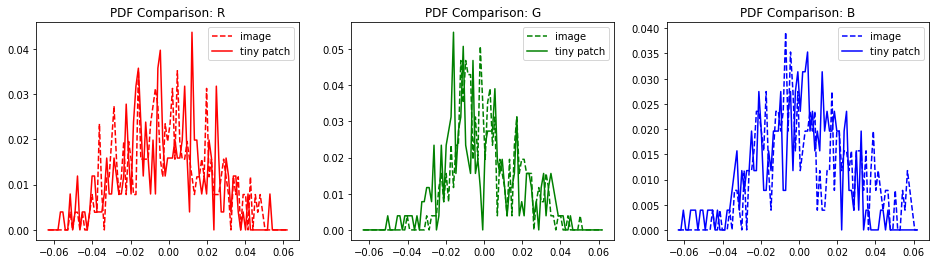

KL 2.019600315607125


In [108]:
# PDFs of tiny patch1 versus tiny patch 2

#edges = tf.linspace(-0.1,0.1,100)

li = 3*tf.math.reduce_std(res_patch2)
edges = tf.linspace(-li,li,100)

plt.figure(figsize=(16,4))

# R
res_histo = tfp.stats.histogram(res_patch2[:,:,0], edges)
res_pdf = res_histo/tf.reduce_sum(res_histo)      # pdf sums to 1

res_patch_histo = tfp.stats.histogram(res_patch[:,:,0], edges)
res_patch_pdf = res_patch_histo/tf.reduce_sum(res_patch_histo)      # pdf sums to 1

KLdivR = tf.keras.losses.kullback_leibler_divergence(res_pdf, res_patch_pdf).numpy()

print('KL divR: ',KLdivR)

plt.subplot(1,3,1)
plt.plot(edges[:-1], res_pdf, color='r', ls = '--', label='image')
plt.plot(edges[:-1], res_patch_pdf, color='r', ls = '-', label='tiny patch')
plt.title('PDF Comparison: R')
plt.legend()

# G
res_histo = tfp.stats.histogram(res_patch2[:,:,1], edges)
res_pdf = res_histo/tf.reduce_sum(res_histo)      # pdf sums to 1

res_patch_histo = tfp.stats.histogram(res_patch[:,:,1], edges)
res_patch_pdf = res_patch_histo/tf.reduce_sum(res_patch_histo)      # pdf sums to 1

KLdivG = tf.keras.losses.kullback_leibler_divergence(res_pdf, res_patch_pdf).numpy()

print('KL divG: ',KLdivG)

plt.subplot(1,3,2)
plt.plot(edges[:-1], res_pdf, color='g', ls = '--', label='image')
plt.plot(edges[:-1], res_patch_pdf, color='g', ls = '-', label='tiny patch')
plt.title('PDF Comparison: G')
plt.legend()

# B
res_histo = tfp.stats.histogram(res_patch2[:,:,2], edges)
res_pdf = res_histo/tf.reduce_sum(res_histo)      # pdf sums to 1

res_patch_histo = tfp.stats.histogram(res_patch[:,:,2], edges)
res_patch_pdf = res_patch_histo/tf.reduce_sum(res_patch_histo)      # pdf sums to 1

KLdivB = tf.keras.losses.kullback_leibler_divergence(res_pdf, res_patch_pdf).numpy()

print('KL divB: ',KLdivB)

plt.subplot(1,3,3)
plt.plot(edges[:-1], res_pdf, color='b', ls = '--', label='image')
plt.plot(edges[:-1], res_patch_pdf, color='b', ls = '-', label='tiny patch')
plt.title('PDF Comparison: B')
plt.legend()


plt.show()

print('KL',np.sqrt(KLdivR**2 + KLdivG**2 + KLdivB**2))

In [109]:
print(np.linalg.norm(res))
print(np.linalg.norm(res_patch))
print(np.linalg.norm(res_patch2))

4.3127
0.60043794
0.5882871


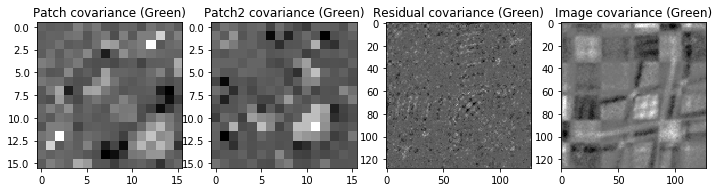

In [110]:
# cov method 1
# Don't flatten the image
plt.figure(figsize=(12,4))
plt.subplot(141)
plt.imshow(tf.transpose(res_patch[:,:,1]) * res_patch[:,:,1], cmap='gray')
plt.title('Patch covariance (Green)')
plt.subplot(142)
plt.imshow(tf.transpose(res_patch2[:,:,1]) * res_patch2[:,:,1], cmap='gray')
plt.title('Patch2 covariance (Green)')
plt.subplot(143)
res_cov = tf.transpose(res[:,:,1]) * res[:,:,1]
plt.imshow(res_cov, cmap='gray')
plt.title('Residual covariance (Green)')
plt.subplot(144)
im_cov = tf.transpose(val_ex[0][ind][:,:,1]) * val_ex[0][ind][:,:,1]
plt.imshow(im_cov, cmap='gray')
plt.title('Image covariance (Green)')
plt.show()


In [111]:
# PSNR between Res Cov and Im cov (measure of similarity)
tf.image.psnr(tf.expand_dims(res_cov, axis=2),tf.expand_dims(im_cov, axis=2), max_val=1).numpy()

44.896065

In [112]:
cov_res_R = tf.norm(tf.transpose(res[:,:,0]) * res[:,:,0])
cov_res_G = tf.norm(tf.transpose(res[:,:,1]) * res[:,:,1])
cov_res_B = tf.norm(tf.transpose(res[:,:,2]) * res[:,:,2])
cov_loss = tf.sqrt(tf.square(cov_res_R) + tf.square(cov_res_G) + tf.square(cov_res_B))
cov_loss

<tf.Tensor: id=40223, shape=(), dtype=float32, numpy=0.08570533>

norm2(res_cov): 0.032969728112220764 	 norm2(im_cov): 0.7303809523582458


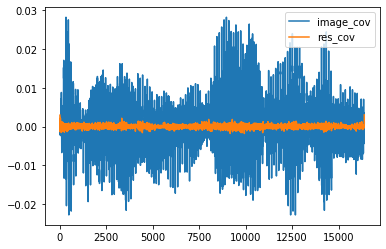

In [113]:
plt.plot(im_cov.numpy().reshape(-1,1), label = 'image_cov')
plt.plot(res_cov.numpy().reshape(-1,1), label = 'res_cov')
plt.legend()
plt.plot()

print(f'norm2(res_cov): {np.linalg.norm(res_cov)} \t norm2(im_cov): {np.linalg.norm(im_cov)}')

In [114]:
# TV of covariances
im_TV = tf.image.total_variation(tf.expand_dims(im_cov, axis=2)).numpy()
res_TV = tf.image.total_variation(tf.expand_dims(res_cov, axis=2)).numpy()

print(f'cov_im_TV: {im_TV} \t cov_res_TV: {res_TV}')

cov_im_TV: 45.044593811035156 	 cov_res_TV: 6.197062015533447


In [115]:
# TV of images (patch and residual)
im_TV = tf.image.total_variation(tf.expand_dims(val_ex[0][ind][:,:,1], axis=2)).numpy()
res_TV = tf.image.total_variation(tf.expand_dims(res[:,:,1], axis=2)).numpy()

print(f'im_TV: {im_TV} \t res_TV: {res_TV}')

im_TV: 449.88580322265625 	 res_TV: 342.202392578125


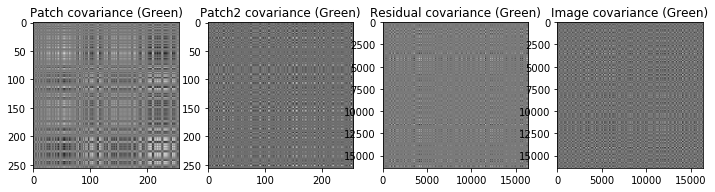

In [116]:
#cov_method 2
# Flatten image BEFORE cov

plt.figure(figsize=(12,4))
plt.subplot(141)
p_dat = res_patch[:,:,1].numpy().reshape(-1,1)
plt.imshow(tf.transpose(p_dat) * p_dat, cmap='gray')
plt.title('Patch covariance (Green)')

plt.subplot(142)
p2_dat = res_patch2[:,:,1].numpy().reshape(-1,1)
plt.imshow(tf.transpose(p2_dat) * p2_dat, cmap='gray')
plt.title('Patch2 covariance (Green)')

plt.subplot(143)
res_dat = res[:,:,1].numpy().reshape(-1,1)
plt.imshow(tf.transpose(res_dat) * res_dat, cmap='gray')
plt.title('Residual covariance (Green)')

plt.subplot(144)
im_dat = val_ex[0][ind][:,:,1].numpy().reshape(-1,1)
plt.imshow(tf.transpose(im_dat) * im_dat, cmap='gray')
plt.title('Image covariance (Green)')
plt.show()

In [117]:
np.max(tf.transpose(res[:,:,0]) * res[:,:,0])

0.0036350924

Text(0.5, 1.0, 'Noise Histo')

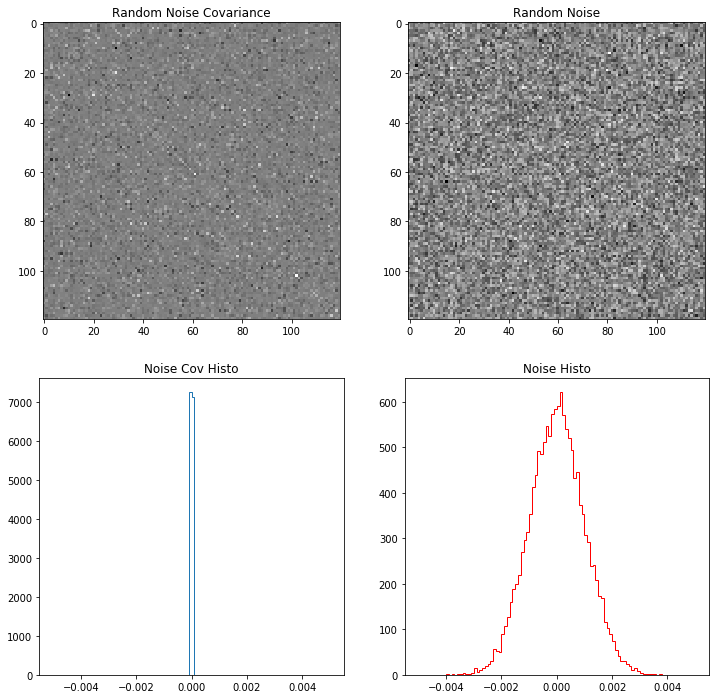

In [118]:
li = 0.005

noise = tf.random.normal(shape=(120,120), mean=0.0, stddev=1e-3, dtype=tf.float32)
noise_cov = (tf.transpose(noise) * noise).numpy()

plt.figure(figsize=(12,12))
plt.subplot(221)
plt.imshow(noise_cov, cmap='gray')
plt.title('Random Noise Covariance')

plt.subplot(222)
plt.imshow(noise, cmap='gray')
plt.title('Random Noise')

plt.subplot(223)
plt.hist(noise_cov.reshape(-1,1), histtype='step', range=(-li,li), bins=100, label='Random Noise covl')
plt.title('Noise Cov Histo')

plt.subplot(224)
plt.hist(noise.numpy().reshape(-1,1), histtype='step', range=(-li,li), bins=100, label='G Residual cov', color='r')
plt.title('Noise Histo')


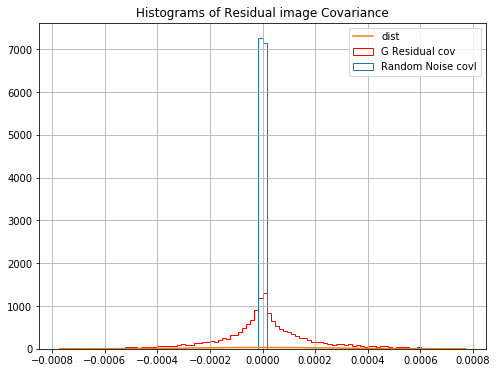

Mean:  [-0.00019266 -0.00098576 -0.00024755]
Std:  [0.02164818 0.01582581 0.02037263]


In [119]:
im_cov = (tf.transpose(val_ex[0][ind][:,:,1]) * val_ex[0][ind][:,:,1]).numpy().reshape(-1,1)
cov = (tf.transpose(res[:,:,1]) * res[:,:,1]).numpy().reshape(-1,1)

li = 3*cov.std()

plt.figure(figsize=(8,6))

plt.hist(cov, histtype='step', range=(-li,li), bins=100, label='G Residual cov', color='r')
plt.hist(noise_cov.reshape(-1,1), histtype='step', range=(-li,li), bins=100, label='Random Noise covl')

from scipy.stats import norm
x = np.linspace(-li,li, num=100)
d = norm.pdf(x, 0, cov.std())
d = d/50
plt.plot(x,d,label = 'dist')

plt.legend()
plt.grid()
plt.title('Histograms of Residual image Covariance')
plt.show()


print('Mean: ',res.numpy().reshape(-1,3).mean(axis=-2))
print('Std: ',res.numpy().reshape(-1,3).std(axis=-2))


In [121]:
cov_matrix = tfp.stats.covariance(resr, resr, sample_axis=0, event_axis=None)

In [122]:
cov_matrix.shape

TensorShape([3])

In [123]:
cov_matrix

<tf.Tensor: id=40461, shape=(3,), dtype=float32, numpy=array([0.00046864, 0.00025046, 0.00041505], dtype=float32)>

In [120]:
resr = tf.reshape(res,[128*128,3])

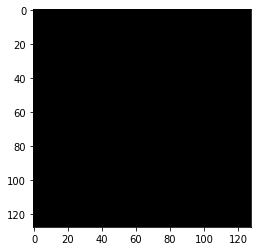

In [101]:
plt.imshow(tf.reshape(cov_matrix, [128,128]).numpy(), cmap='gray')

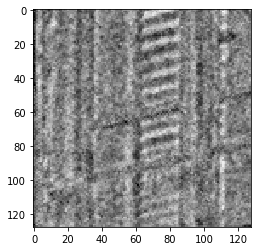

In [74]:
plt.imshow(res.numpy().squeeze(), cmap='gray')

In [72]:
cov_matrix

<tf.Tensor: id=37701, shape=(128, 128), dtype=float32, numpy=
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)>